#Importing database and connecting server to the database

In [1]:
import psycopg2
connection = psycopg2.connect(user ='postgres',
                              password = 'itmm1315@VZU',
                              host = 'localhost',
                              port = '5432',
                              database = 'trading_timeseries'
)
cursor = connection.cursor()
cursor.execute('Select * From Store')
results = cursor.fetchall()
print(results)
cursor.close()

[(datetime.date(2022, 1, 1), 'S001', 'P0001', 'Groceries', 'North', 231, 127, 55, Decimal('135.47'), Decimal('33.50'), Decimal('20.00'), 'Rainy', False, Decimal('29.69'), 'Autumn'), (datetime.date(2022, 1, 1), 'S001', 'P0002', 'Toys', 'South', 204, 150, 66, Decimal('144.04'), Decimal('63.01'), Decimal('20.00'), 'Sunny', False, Decimal('66.16'), 'Autumn'), (datetime.date(2022, 1, 1), 'S001', 'P0003', 'Toys', 'West', 102, 65, 51, Decimal('74.02'), Decimal('27.99'), Decimal('10.00'), 'Sunny', True, Decimal('31.32'), 'Summer'), (datetime.date(2022, 1, 1), 'S001', 'P0004', 'Toys', 'North', 469, 61, 164, Decimal('62.18'), Decimal('32.72'), Decimal('10.00'), 'Cloudy', True, Decimal('34.74'), 'Autumn'), (datetime.date(2022, 1, 1), 'S001', 'P0005', 'Electronics', 'East', 166, 14, 135, Decimal('9.26'), Decimal('73.64'), Decimal('0.00'), 'Sunny', False, Decimal('68.95'), 'Summer'), (datetime.date(2022, 1, 1), 'S001', 'P0006', 'Groceries', 'South', 138, 128, 102, Decimal('139.82'), Decimal('76.83'

Importing important libraries for demand forecasting 

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsforecast import StatsForecast
from statsforecast.models import AutoARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, mean_absolute_error

c:\Users\awneesh.kumar\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Loading data from postgresql database to pandas

In [3]:
df = pd.read_sql_query('select * from store', connection)
df['date']= pd.to_datetime(df['date'])
df.columns

C:\Users\awneesh.kumar\AppData\Local\Temp\ipykernel_21988\3807772900.py:1: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql_query('select * from store', connection)


Index(['date', 'store_id', 'product_id', 'category', 'region',
       'inventory_level', 'units_sold', 'units_ordered', 'demand_forecast',
       'price', 'discount', 'weather_condition', 'holiday_promotion',
       'competitor_pricing', 'seasonality'],
      dtype='object')

Seperating numeric columns from tags and categorical data

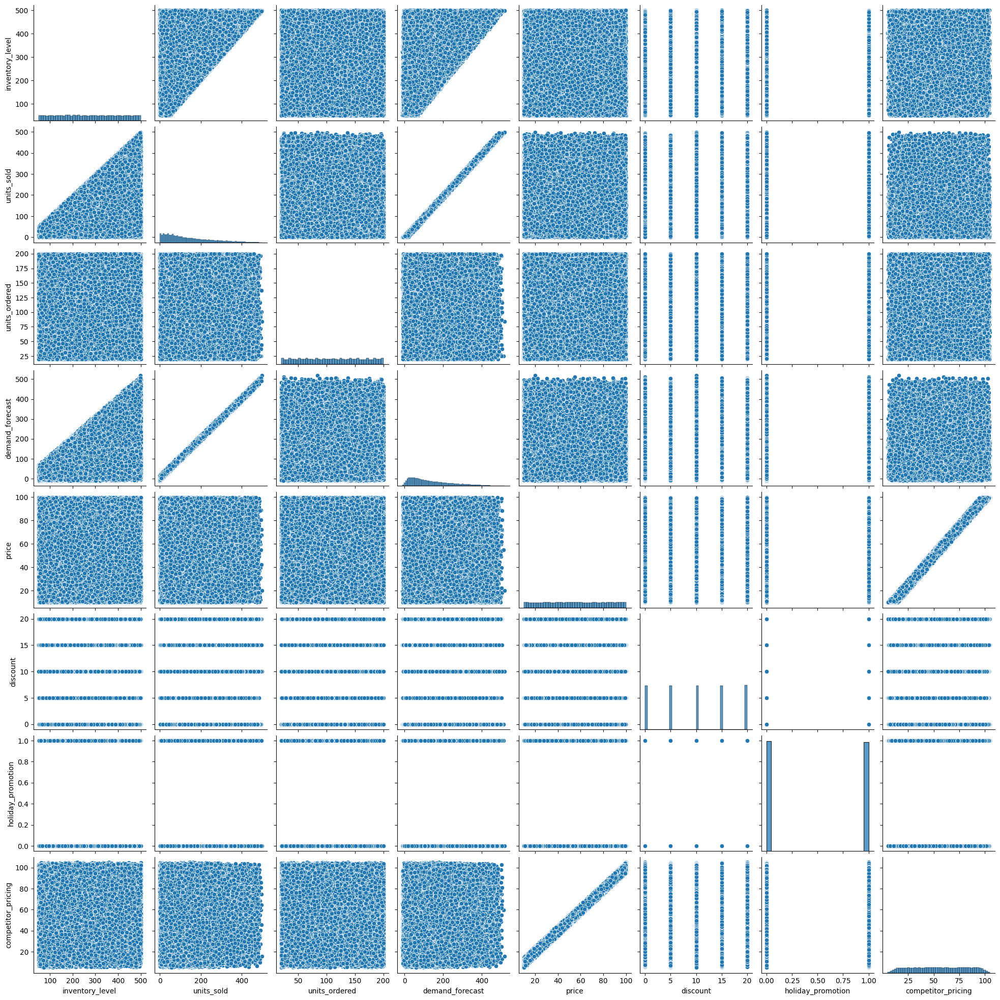

In [10]:
Numeric_col = ['inventory_level', 'units_sold', 'units_ordered', 'demand_forecast',
       'price', 'discount','competitor_pricing']
Category_col = ['category', 'region','weather_condition','seasonality']
Name_col = ['date', 'store_id', 'product_id']
sns.pairplot(df)
plt.show()

Creating pairs of each product in each store

In [5]:
store_id = df['store_id'].iloc[0]
product_id = df['product_id'].iloc[0]

SI_PI = df[(df['store_id'] == store_id) &
           (df['product_id'] == product_id)]
pairs = df[['store_id', 'product_id']].drop_duplicates()
print("Number of pairs:", len(pairs))
print(pairs.describe())

Number of pairs: 100
       store_id product_id
count       100        100
unique        5         20
top        S001      P0001
freq         20          5


Looping for each pair and fitting AutoARIMA model with ARIMA and SARIMA

ID: S001_P0001
MAPE ARIMA: 4211868537192448.0
RMSE ARIMA: 109.6
MAPE SARIMA: 4211868537192448.0
RMSE SARIMA: 109.6
ID: S001_P0002
MAPE ARIMA: 2.97
RMSE ARIMA: 96.95
MAPE SARIMA: 2.97
RMSE SARIMA: 96.95
ID: S001_P0003
MAPE ARIMA: 3.87
RMSE ARIMA: 110.52
MAPE SARIMA: 3.87
RMSE SARIMA: 110.52
ID: S001_P0004
MAPE ARIMA: 3782751106891776.0
RMSE ARIMA: 113.06
MAPE SARIMA: 4969744239165440.0
RMSE SARIMA: 113.67
ID: S001_P0005
MAPE ARIMA: 3.14
RMSE ARIMA: 106.95
MAPE SARIMA: 3.14
RMSE SARIMA: 106.95
ID: S001_P0006
MAPE ARIMA: 4007851148181504.0
RMSE ARIMA: 109.02
MAPE SARIMA: 4007851148181504.0
RMSE SARIMA: 109.02
ID: S001_P0007
MAPE ARIMA: 3.13
RMSE ARIMA: 97.32
MAPE SARIMA: 3.13
RMSE SARIMA: 97.32
ID: S001_P0008
MAPE ARIMA: 4.68
RMSE ARIMA: 110.47
MAPE SARIMA: 4.68
RMSE SARIMA: 110.47
ID: S001_P0009
MAPE ARIMA: 2.06
RMSE ARIMA: 106.85
MAPE SARIMA: 2.06
RMSE SARIMA: 106.85
ID: S001_P0010
MAPE ARIMA: 3949987469721600.0
RMSE ARIMA: 116.79
MAPE SARIMA: 3949987469721600.0
RMSE SARIMA: 116.79
ID: 

<Axes: >

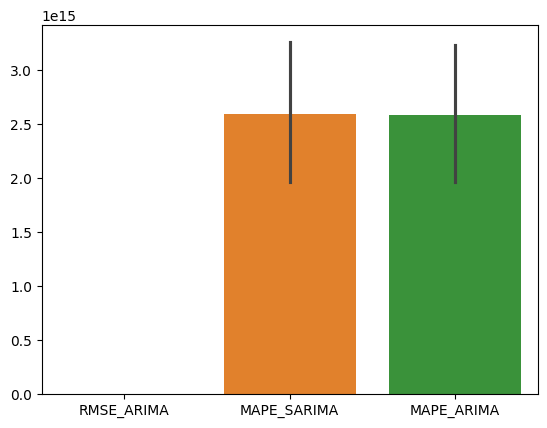

In [ ]:
results_table = []
for i, row in enumerate(pairs.itertuples(index=False)):
    SI_PI = df[(df['store_id'] == row.store_id) & (df['product_id'] == row.product_id)]
    SI_PI = SI_PI.sort_values('date')
    SI_PI = SI_PI.set_index('date')
    SI_PI = SI_PI.asfreq('D')
    SI_PI = SI_PI.drop(columns=['demand_forecast'])
    SI_PI = pd.get_dummies(SI_PI, columns = Category_col, drop_first = True)
    SI_PI['holiday_promotion'] = SI_PI['holiday_promotion'].astype(int)
    SI_PI = SI_PI.reset_index()
    SI_PI['unique_id'] = f"{row.store_id}_{row.product_id}"
    SI_PI['unique_id'].astype(str)
    SI_PI = SI_PI[['date', 'unique_id', 'units_sold']]
    SI_PI.columns = ['ds', 'unique_id', 'y']

    #Fitting AutoARIMA for Arima as well as SARIMA predictions
    Au_AR = [AutoARIMA(seasonal= False, alias='ARIMA'), AutoARIMA(seasonal=True, season_length=7, alias='SARIMA')]
    split = int(len(SI_PI) * 0.8)
    SI_PI_train, SI_PI_test = SI_PI.iloc[:split], SI_PI.iloc[split:]
    sf = StatsForecast(models = Au_AR, freq = 'D', n_jobs=-1)
    sf.fit(SI_PI_train)
    h = len(SI_PI_test)
    forecast_df = sf.forecast(df=SI_PI_train, h=h, fitted=True)
    model_dict = sf.fitted_[0][0].model_
    model_dict1 = sf.fitted_[0][1].model_
    arima_pred = sf.predict(h=int(len(SI_PI_test)))
    arima_eval_df = pd.merge(arima_pred, SI_PI_test[['ds', 'unique_id', 'y']], 
                            on=['ds', 'unique_id'], how='inner')
    print('ID:', arima_eval_df['unique_id'].iloc[0])
    MAPE_ARIMA = round(mean_absolute_percentage_error(arima_eval_df['y'], arima_eval_df['ARIMA']), 2)
    RMSE_ARIMA =round(np.sqrt(mean_squared_error(arima_eval_df['y'], arima_eval_df['ARIMA'])), 2) 
    MAPE_SARIMA = round(mean_absolute_percentage_error(arima_eval_df['y'], arima_eval_df['SARIMA']), 2)
    RMSE_SARIMA =round(np.sqrt(mean_squared_error(arima_eval_df['y'], arima_eval_df['SARIMA'])), 2) 
    print("MAPE ARIMA:", MAPE_ARIMA)
    print("RMSE ARIMA:", RMSE_ARIMA)
    print("MAPE SARIMA:", MAPE_SARIMA)
    print("RMSE SARIMA:", RMSE_SARIMA)
    
    results_table.append({
    'unique_id': arima_eval_df['unique_id'].iloc[0],
        'RMSE_ARIMA': RMSE_ARIMA,'MAPE_SARIMA': RMSE_SARIMA,
        'MAPE_ARIMA': MAPE_ARIMA,'MAPE_SARIMA': MAPE_SARIMA})
results_df = pd.DataFrame(results_table)
print(results_df) 